## NN EVEN log1p(xtanh(x)) - (dt -> 0.0005)

In [1]:
import torch
import torch.nn as nn
import os
import sys
sys.path.append('../../../')
import utils.funciones as fns
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.ticker as ticker
fns.formato_graficas()

## DATA

In [2]:
float_user = torch.float64

# Masas (normalizadas por la masa del Sol)
masa = torch.tensor([
    1.988410e30,   # Sol
    3.302e23,      # Mercurio
    4.8685e24,     # Venus
    5.97219e24,    # Tierra
    6.4171e23,     # Marte
    1.89819e27,    # Júpiter
    5.6834e26,     # Saturno
    8.6813e25,     # Urano
    1.02409e26,    # Neptuno
    1.303e22       # Plutón
], dtype=torch.float64) / 1.988410e30

masa = torch.repeat_interleave(masa, repeats=3)

planets = ["Sun",
            "Mercury",
            "Venus",
            "Earth",
            "Mars",
            "Jupiter",
            "Saturn",
            "Uranus",
            "Neptune",
            "Pluto"

            ]
colores_reales = ["indianred", "lime", "orange"]
ejes = ["X (UA)", "Y (UA)", "Z (UA)"]

# Data
start_val = 6_400_000
years_val = 800
val_steps = int(years_val / 0.0005) + 1
fin_val = start_val + val_steps

Sz = np.load("../../../Data/dt_0.0005/normalization_vectors.npz")['Z_norm'].astype('float64')
Sz_dot = np.load("../../../Data/dt_0.0005/normalization_vectors.npz")['Z_dot_norm'].astype('float64')
with np.load("../../../Data/Z.npz", mmap_mode='r') as data:
    Zt = data['z'][start_val:fin_val, ...].astype('float64')

q_init = Zt[0, :30]
p_init = Zt[0, 30:]

# 800-Year Periodic Evaluation: 3200 to 4000

In [3]:
# Years
years = 800
years_img = [10, 50, 100, 200, 400, 600, 800]
dt_cnst = 0.0005
colors = ["#FFFFFF", "#00FFFF", "#FF00FF", "#39FF14", "#FF4500", "#FFD700", "#E6A8FF", "#00FF90", "#1E90FF", "#FF9999"]

# Loading NN

In [ ]:
# Modelo
class even(nn.Module):
        def __init__(self):
            super(even, self).__init__()

        def forward(self, x):
            return torch.log1p(x*torch.tanh(x))

name_dir = "SLL-experiment-with-mesh-0.0005/NN EVEN log1p(xtanh(x))"
name_iter = "HNN_EVEN_log1p(xtanh(x))"
name_graph = "Log1p(xTanh(x))"
device = torch.device("cpu")

path_model = f'../../../{name_dir}/models/best_test_{name_iter}.pth'
path_metrics = f'../../../{name_dir}/metrics/metricas_{name_iter}.txt'

h_net = fns.Block_HNN_SL(func_act_V=even).double().to(device)
checkpoint = torch.load(path_model, map_location=device, weights_only=False)
h_net.load_state_dict(checkpoint['model_state_dict'], strict=False)

h_net_comp = torch.compile(h_net, mode="reduce-overhead")
h_net_comp.eval()

print(f"\nNumber of parameters: {sum(p.numel() for p in h_net_comp.parameters())}")

Inicializando capa: Linear(in_features=30, out_features=256, bias=True)
Inicializando capa: Linear(in_features=256, out_features=256, bias=True)
Inicializando capa: Linear(in_features=256, out_features=256, bias=True)
Inicializando capa: Linear(in_features=256, out_features=1, bias=True)

Number of parameters: 139987


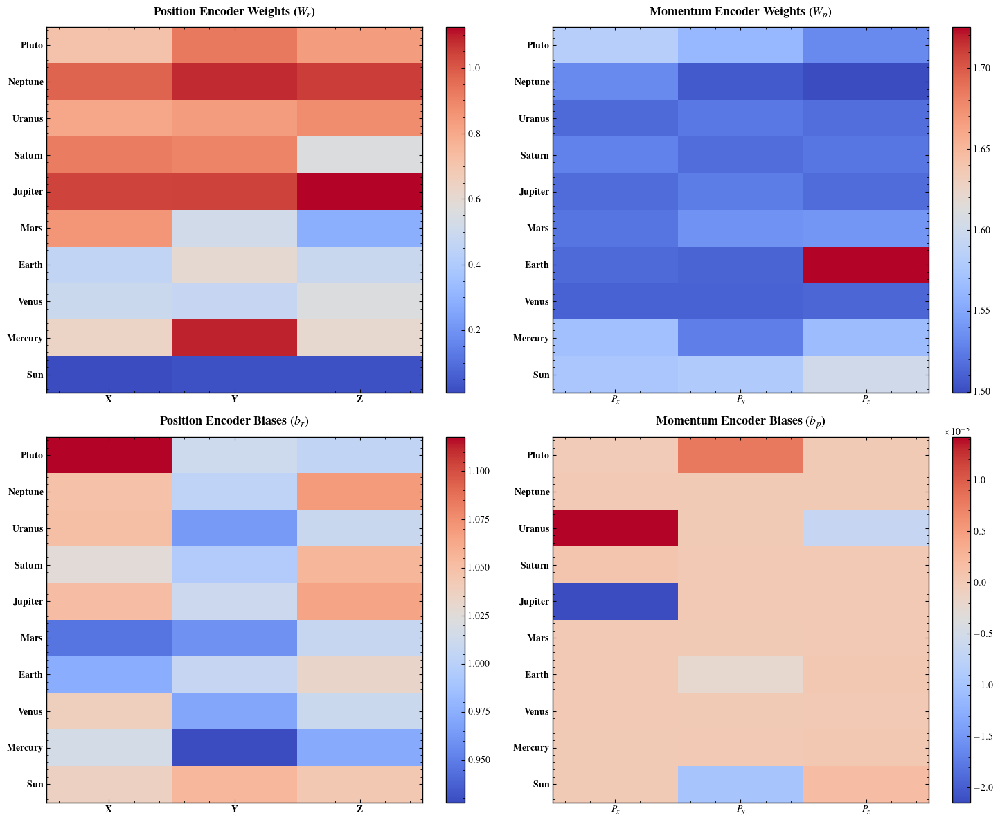

In [5]:
# ENCODER INSPECTION
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.set_facecolor('#ffffff')

w_r_matrix = h_net_comp.w_r.detach().cpu().numpy().reshape(10, 3)
w_p_matrix = h_net_comp.w_p.detach().cpu().numpy().reshape(10, 3)
w_rb_matrix = h_net_comp.w_rb.detach().cpu().numpy().reshape(10, 3)
w_pb_matrix = h_net_comp.w_pb.detach().cpu().numpy().reshape(10, 3)

im0 = axes[0, 0].imshow(w_r_matrix, cmap='coolwarm', aspect='auto', origin='lower')
axes[0, 0].set_title(r"\textbf{Position Encoder Weights ($W_r$)}", fontsize=13, pad=12)
axes[0, 0].set_yticks(range(10))
axes[0, 0].set_yticklabels([fr"\textbf{{{p}}}" for p in planets], fontsize=10)
axes[0, 0].set_xticks(range(3))
axes[0, 0].set_xticklabels([r"\textbf{X}", r"\textbf{Y}", r"\textbf{Z}"], fontsize=10)
fig.colorbar(im0, ax=axes[0, 0])
axes[0, 0].grid(False)

im1 = axes[0, 1].imshow(w_p_matrix, cmap='coolwarm', aspect='auto', origin='lower')
axes[0, 1].set_title(r"\textbf{Momentum Encoder Weights ($W_p$)}", fontsize=13, pad=12)
axes[0, 1].set_yticks(range(10))
axes[0, 1].set_yticklabels([fr"\textbf{{{p}}}" for p in planets], fontsize=10)
axes[0, 1].set_xticks(range(3))
axes[0, 1].set_xticklabels([r"\textbf{$P_x$}", r"\textbf{$P_y$}", r"\textbf{$P_z$}"], fontsize=10)
fig.colorbar(im1, ax=axes[0, 1])
axes[0, 1].grid(False)

im2 = axes[1, 0].imshow(w_rb_matrix, cmap='coolwarm', aspect='auto', origin='lower')
axes[1, 0].set_title(r"\textbf{Position Encoder Biases ($b_r$)}", fontsize=13, pad=12)
axes[1, 0].set_yticks(range(10))
axes[1, 0].set_yticklabels([fr"\textbf{{{p}}}" for p in planets], fontsize=10)
axes[1, 0].set_xticks(range(3))
axes[1, 0].set_xticklabels([r"\textbf{X}", r"\textbf{Y}", r"\textbf{Z}"], fontsize=10)
fig.colorbar(im2, ax=axes[1, 0])
axes[1, 0].grid(False)

im3 = axes[1, 1].imshow(w_pb_matrix, cmap='coolwarm', aspect='auto', origin='lower')
axes[1, 1].set_title(r"\textbf{Momentum Encoder Biases ($b_p$)}", fontsize=13, pad=12)
axes[1, 1].set_yticks(range(10))
axes[1, 1].set_yticklabels([fr"\textbf{{{p}}}" for p in planets], fontsize=10)
axes[1, 1].set_xticks(range(3))
axes[1, 1].set_xticklabels([r"\textbf{$P_x$}", r"\textbf{$P_y$}", r"\textbf{$P_z$}"], fontsize=10)
fig.colorbar(im3, ax=axes[1, 1])
axes[1, 1].grid(False)

plt.tight_layout()
plt.show()

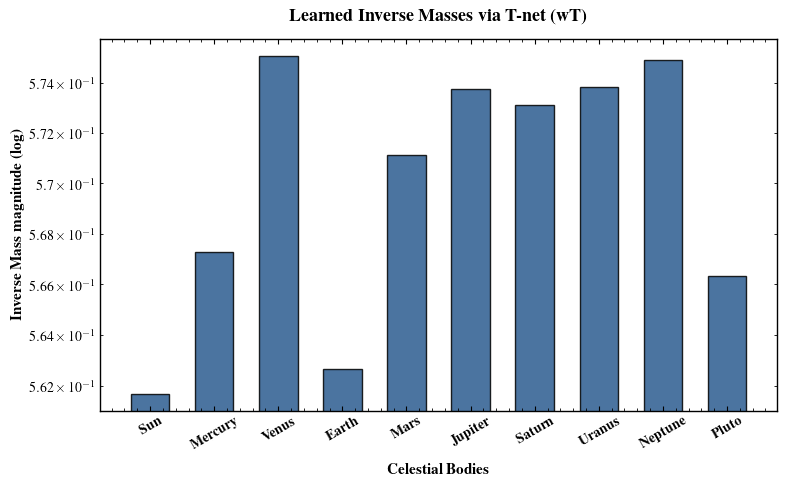

In [6]:
# KINETIC INVERSE MASS INSPECTION

fig, ax = plt.subplots(figsize=(8, 5))
fig.set_facecolor('#ffffff')

wT_np = h_net_comp.wT.detach().cpu().numpy().flatten()

if len(wT_np) == 30:
    wT_grouped = np.zeros(10)
    for i in range(10):
        wT_grouped[i] = np.mean(wT_np[i*3 : (i+1)*3])
else:
    wT_grouped = wT_np

ax.bar(range(10), wT_grouped, color='#2b5c8f', edgecolor='black', alpha=0.85, width=0.6)
ax.set_yscale('log')

ax.set_title(fr"\textbf{{Learned Inverse Masses via T-net ($\mathbf{{wT}}$)}}", fontsize=13, pad=12)
ax.set_xlabel(fr"\textbf{{Celestial Bodies}}", fontsize=11, labelpad=8)
ax.set_ylabel(fr"\textbf{{Inverse Mass magnitude (log)}}", fontsize=11)

ax.set_xticks(range(10))
ax.set_xticklabels([fr"\textbf{{{p}}}" for p in planets], fontsize=10, rotation=30)
ax.tick_params(axis='y', labelsize=10)
ax.grid(False)

plt.tight_layout()
plt.show()

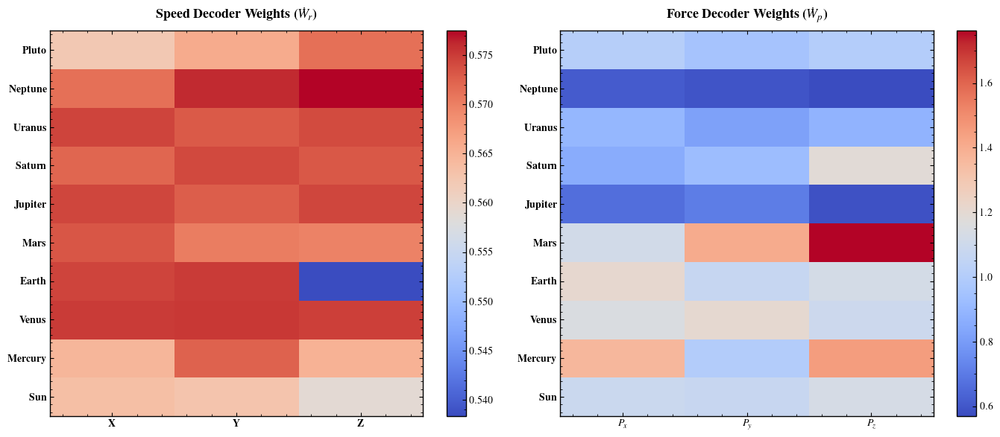

In [7]:
# DECODER INFERENCE INSPECTION
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.set_facecolor('#ffffff')

w_r_dot_matrix = h_net_comp.w_r_dot.detach().cpu().numpy().reshape(10, 3)
w_p_dot_matrix = h_net_comp.w_p_dot.detach().cpu().numpy().reshape(10, 3)

im0 = axes[0].imshow(w_r_dot_matrix, cmap='coolwarm', aspect='auto', origin='lower')
axes[0].set_title(r"\textbf{Speed Decoder Weights ($\dot{W}_r$)}", fontsize=13, pad=12)
axes[0].set_yticks(range(10))
axes[0].set_yticklabels([fr"\textbf{{{p}}}" for p in planets], fontsize=10)
axes[0].set_xticks(range(3))
axes[0].set_xticklabels([r"\textbf{X}", r"\textbf{Y}", r"\textbf{Z}"], fontsize=10)
fig.colorbar(im0, ax=axes[0])
axes[0].grid(False)

im1 = axes[1].imshow(w_p_dot_matrix, cmap='coolwarm', aspect='auto', origin='lower')
axes[1].set_title(r"\textbf{Force Decoder Weights ($\dot{W}_p$)}", fontsize=13, pad=12)
axes[1].set_yticks(range(10))
axes[1].set_yticklabels([fr"\textbf{{{p}}}" for p in planets], fontsize=10)
axes[1].set_xticks(range(3))
axes[1].set_xticklabels([r"\textbf{$P_x$}", r"\textbf{$P_y$}", r"\textbf{$P_z$}"], fontsize=10)
fig.colorbar(im1, ax=axes[1])
axes[1].grid(False)

plt.tight_layout()
plt.show()

# Metrics

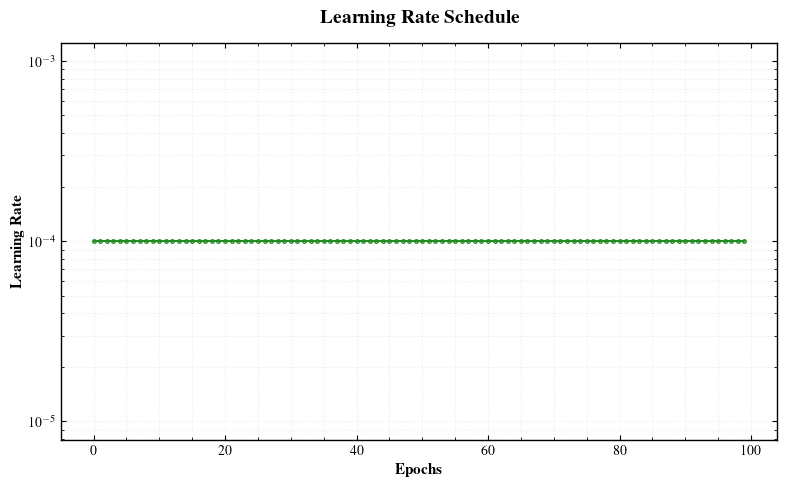

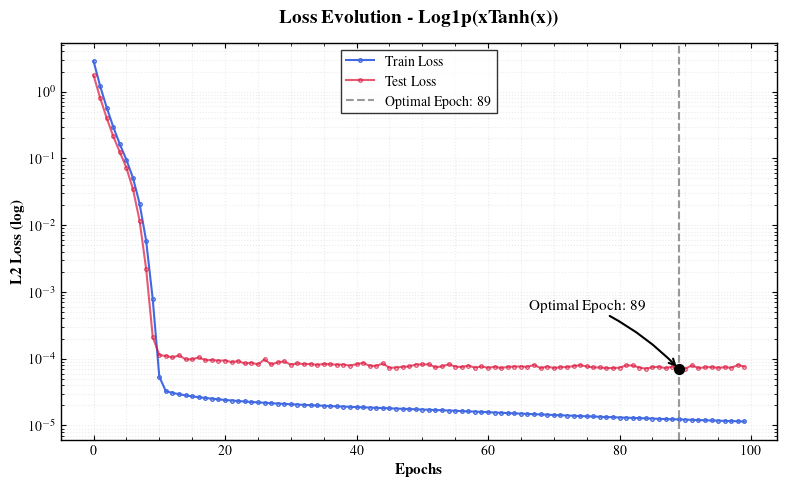

In [8]:
loss_train, loss_test, lrs = fns.leer_metricas_txt(path_metrics)

# Graph 1: Learning Rate Schedule
fig1, ax1 = plt.subplots(figsize=(8, 5))
ax1.plot(lrs, ".-", color='forestgreen', lw=1.5)
ax1.set_title(r"\textbf{Learning Rate Schedule}", fontsize=14, pad=15)
ax1.set_xlabel(r"\textbf{Epochs}", fontsize=11)
ax1.set_ylabel(r"\textbf{Learning Rate}", fontsize=11)
ax1.set_yscale("log")
ax1.grid(True, which="both", alpha=0.3)
ax1.tick_params(axis='both', which='major', labelsize=10)
for label in ax1.get_xticklabels() + ax1.get_yticklabels():
    label.set_weight(800)
plt.tight_layout()
plt.show()

best_epoch = np.argmin(loss_test)
min_loss = loss_test[best_epoch]

# Graph 2: Evolution of Loss
fig2, ax2 = plt.subplots(figsize=(8, 5))
ax2.semilogy(loss_train, ".-", color='royalblue', lw=1.5, label='Train Loss')
ax2.semilogy(loss_test, ".-", color='crimson', lw=1.5, alpha=0.7, label='Test Loss')
ax2.axvline(x=best_epoch, color='gray', linestyle='--', lw=1.5, alpha=0.8, label=f'Optimal Epoch: {best_epoch}')
ax2.scatter(best_epoch, min_loss, color='black', s=50, zorder=5)
ax2.annotate(
    f'Optimal Epoch: {best_epoch}',
    xy=(best_epoch, min_loss),
    xytext=(best_epoch - 5, min_loss * 8), 
    fontsize=11,
    weight=800,
    color='black',
    arrowprops=dict(
        arrowstyle="->", 
        color="black", 
        lw=1.5, 
        connectionstyle="arc3,rad=-0.1" 
    ),
    horizontalalignment='right'  
)
ax2.set_title(fr"\textbf{{Loss Evolution - {name_graph}}}", fontsize=14, pad=15)
ax2.set_xlabel(r"\textbf{Epochs}", fontsize=11)
ax2.set_ylabel(r"\textbf{L2 Loss (log)}", fontsize=11)
ax2.grid(True, which="both", alpha=0.3)
ax2.tick_params(axis='both', which='major', labelsize=10)
for label in ax2.get_xticklabels() + ax2.get_yticklabels():
    label.set_weight(800)
ax2.legend(loc='best', frameon=True, shadow=False, fontsize=10)
plt.tight_layout()
plt.show()

# Model evaluation

In [ ]:
# INT
ubicacion_base = f"../../../results analysis/Training results-mesh-0.0005/{name_graph.lower()}"
os.makedirs(ubicacion_base, exist_ok=True)

total_steps = int(years / dt_cnst + 1)

print(f"Starting global continuous integration up to {years} years...")

Starting global continuous integration up to 800 years...


In [10]:
iterate_integration = False  # Enter True if you wish to integrate with the network
master_path_save = os.path.join(ubicacion_base, f"master_integration_{years}_years.npz")

if iterate_integration:
    # 1. Single continuous integration using the HNN PINN model
    full_nn_q, full_nn_p = fns.scipy_predict_qp_model_orbits(
        model=h_net_comp, 
        q_init=q_init.copy(), 
        p_init=p_init.copy(), 
        steps=total_steps, 
        dt=dt_cnst,
        Sz=Sz,
        Sz_dot=Sz_dot
    )
    print("Integration successfully completed. Processing and saving periods...")
    
    # Save all integrated data at once into a single master file
    np.savez_compressed(master_path_save, r=full_nn_q, p=full_nn_p)
    print(f"Datos guardados exitosamente en: {master_path_save}")

else:
    if os.path.exists(master_path_save):
        print(f"Loading existing integration data from: {master_path_save}")
        datos_cargados = np.load(master_path_save)
        full_nn_q = datos_cargados['r']
        full_nn_p = datos_cargados['p']
        print("Data successfully loaded into 'full_nn_q' and 'full_nn_p'.")
    else:
        raise FileNotFoundError(f"The file was not found in {master_path_save}. Make sure the path is correct or change 'reintegrate' to True.")

Loading existing integration data from: ../../../proof/dt_0.0005/log1p(xtanh(x))/master_integration_800_years.npz
Data successfully loaded into 'full_nn_q' and 'full_nn_p'.


Simulating year 10


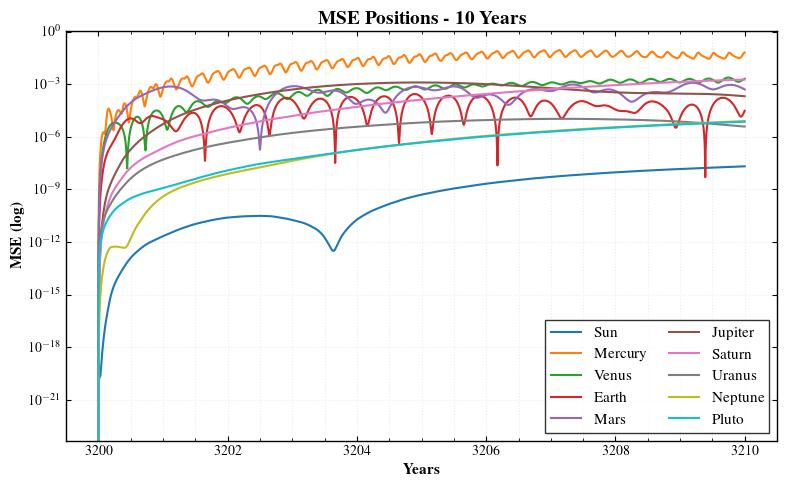

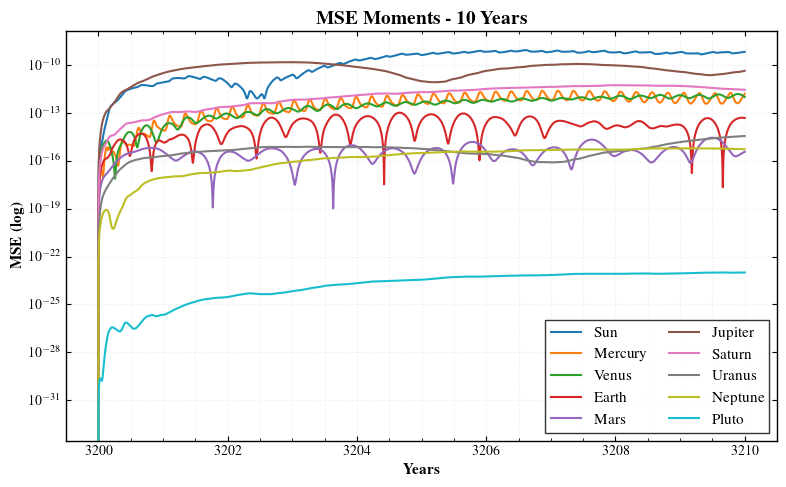

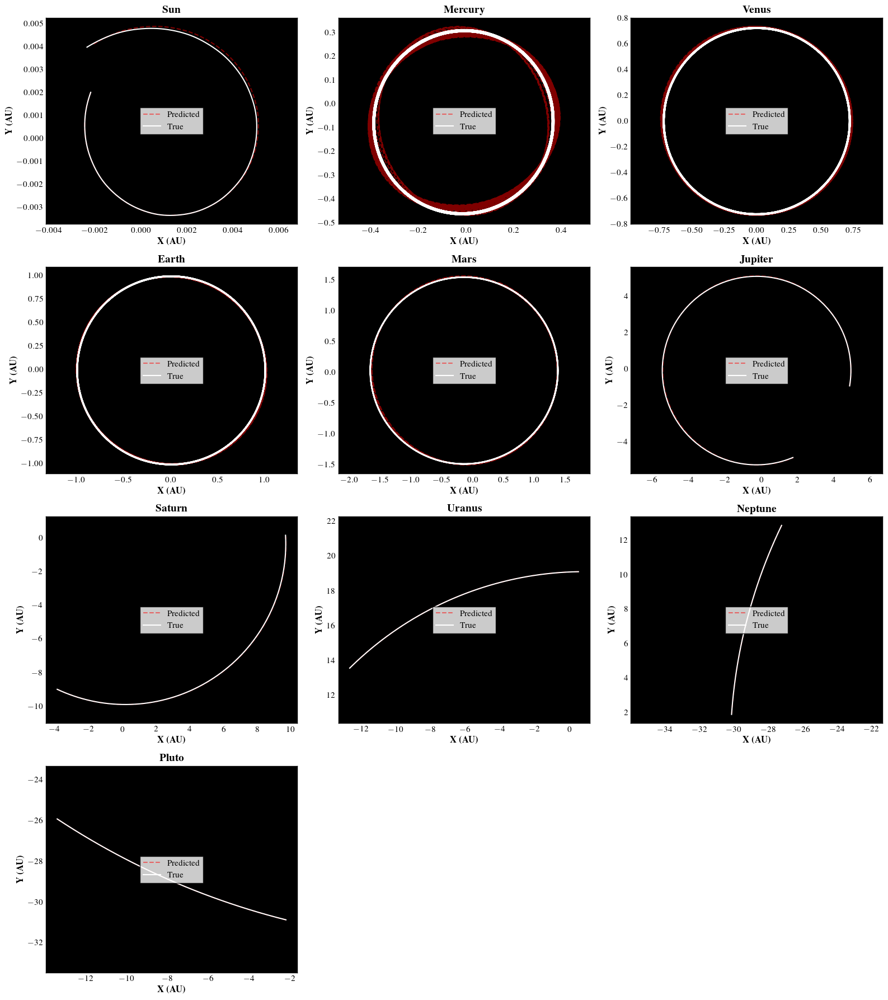

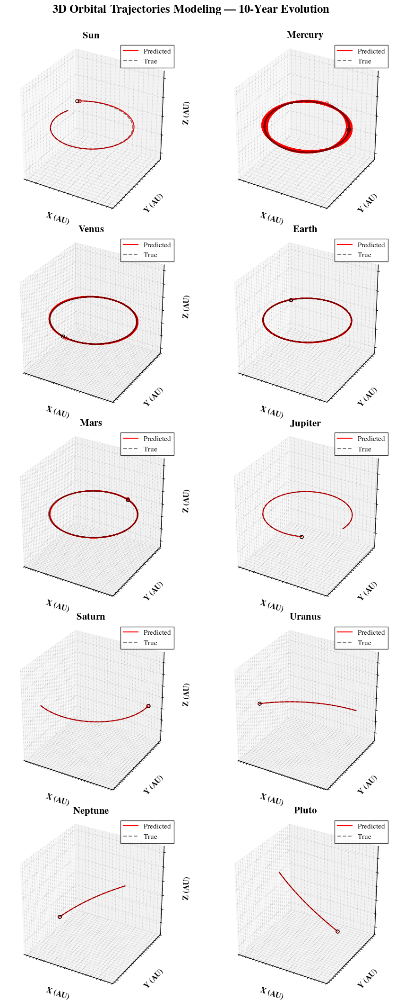

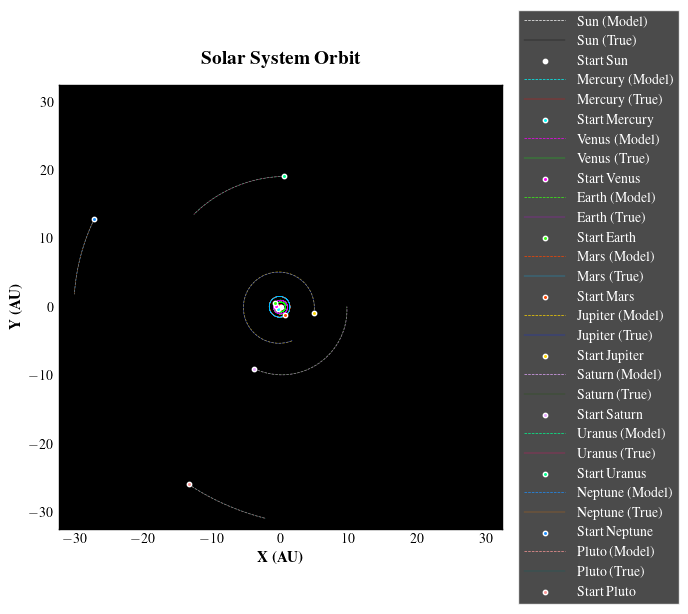

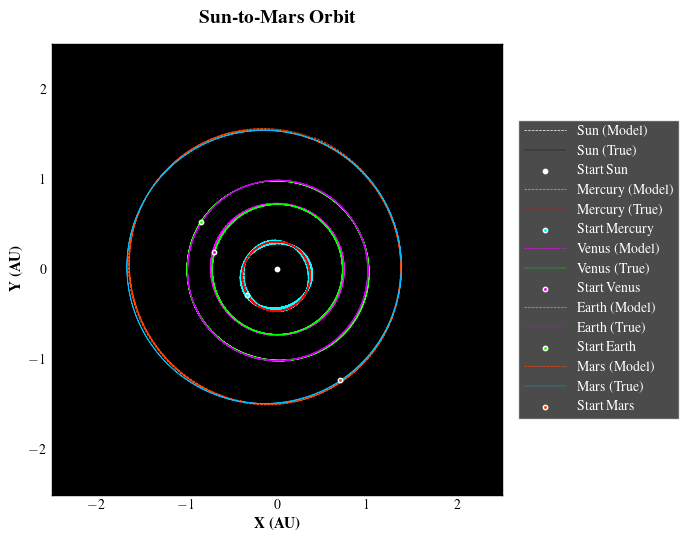

Simulating year 50


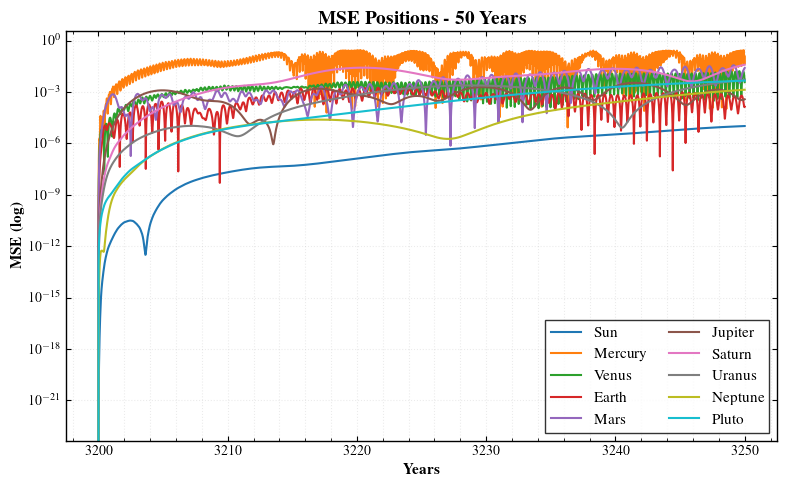

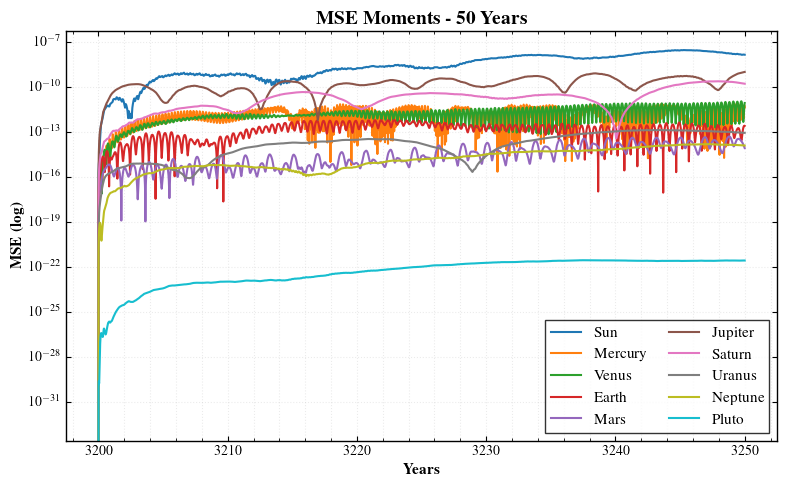

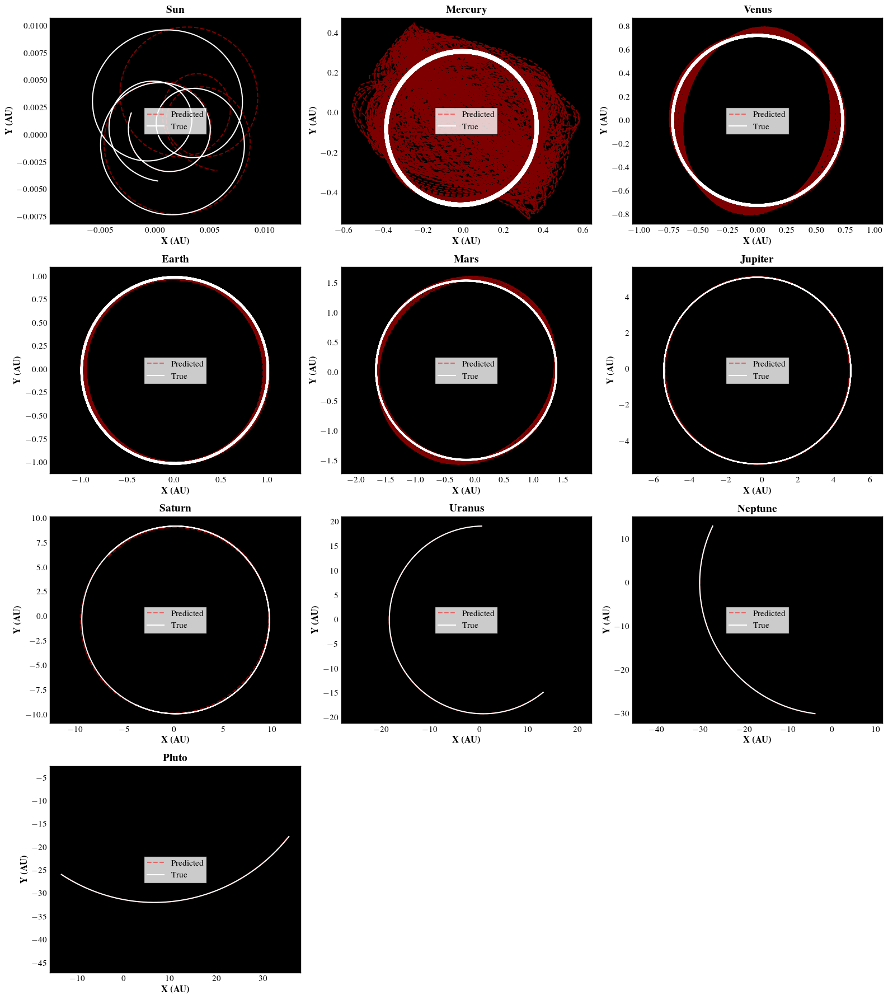

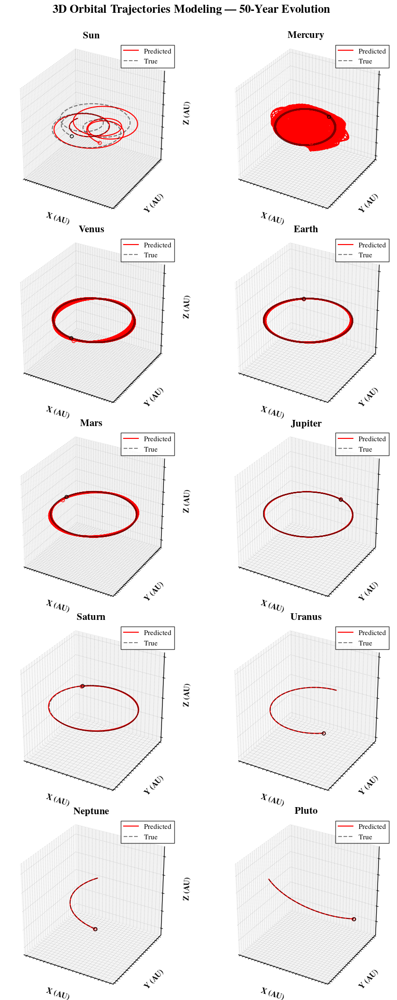

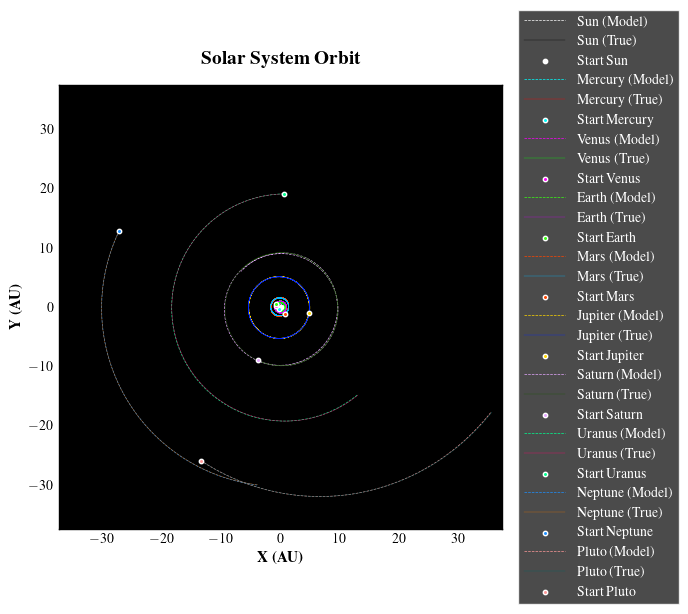

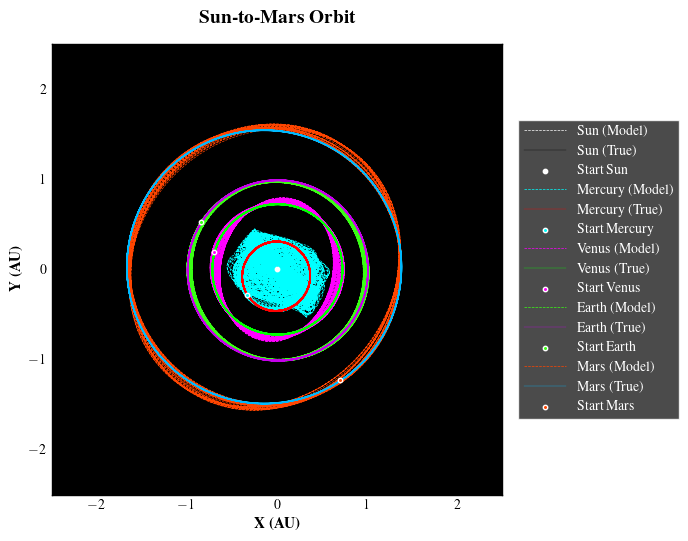

Simulating year 100


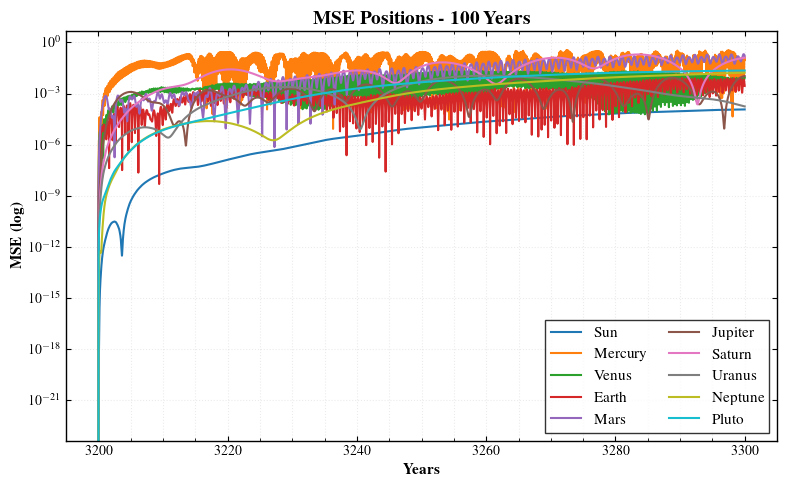

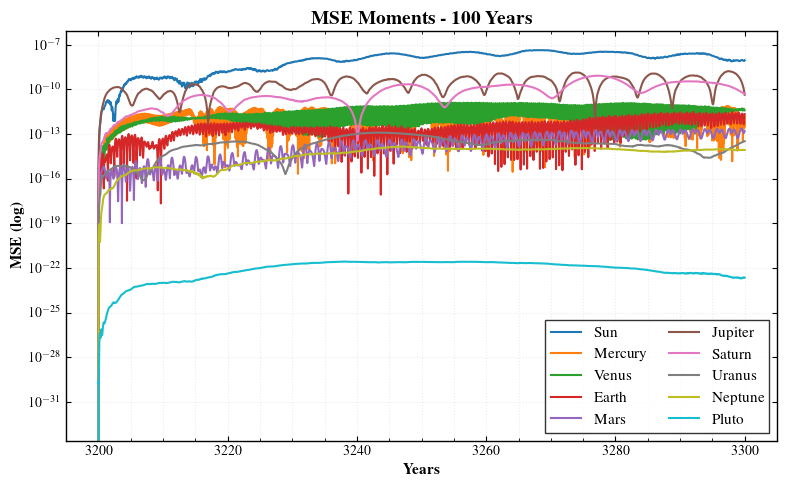

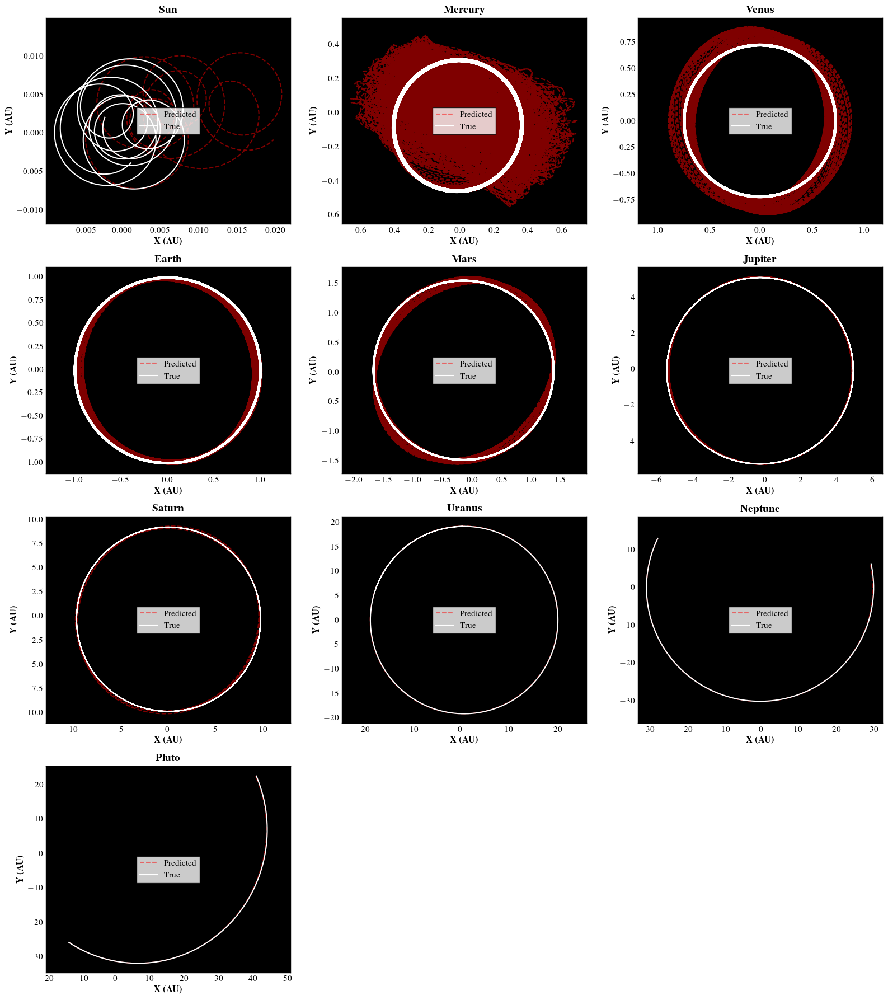

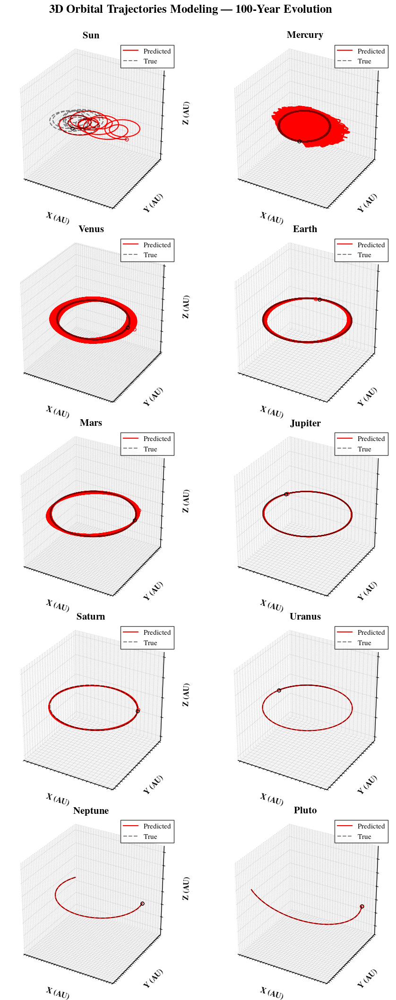

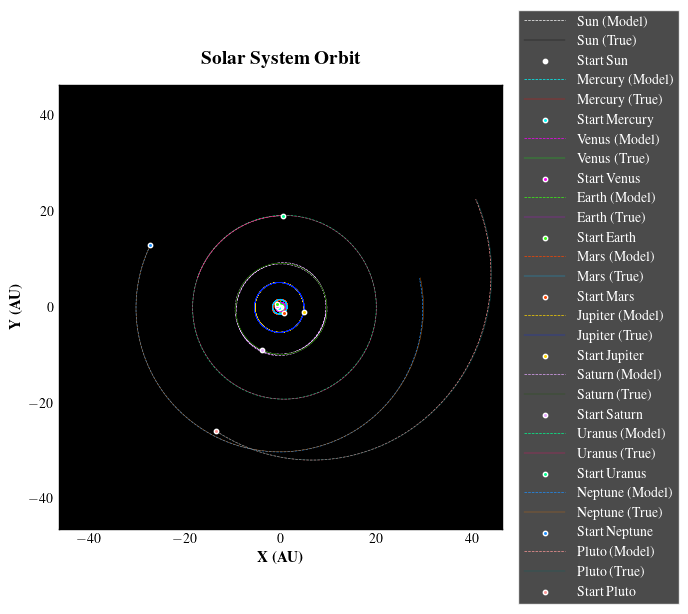

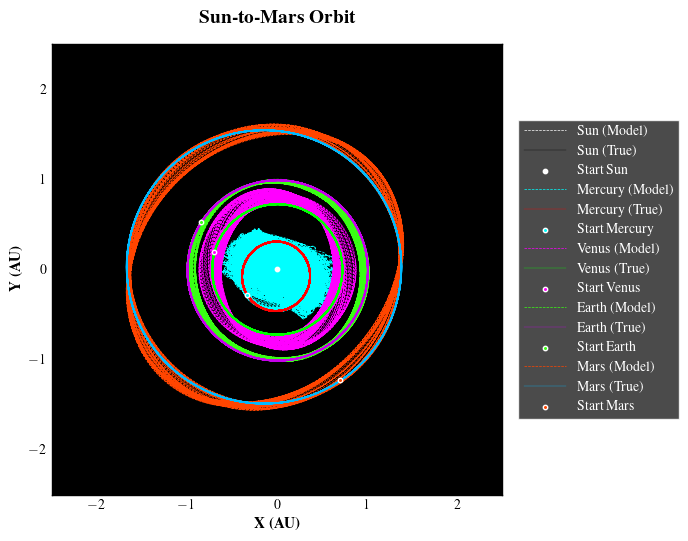

Simulating year 200


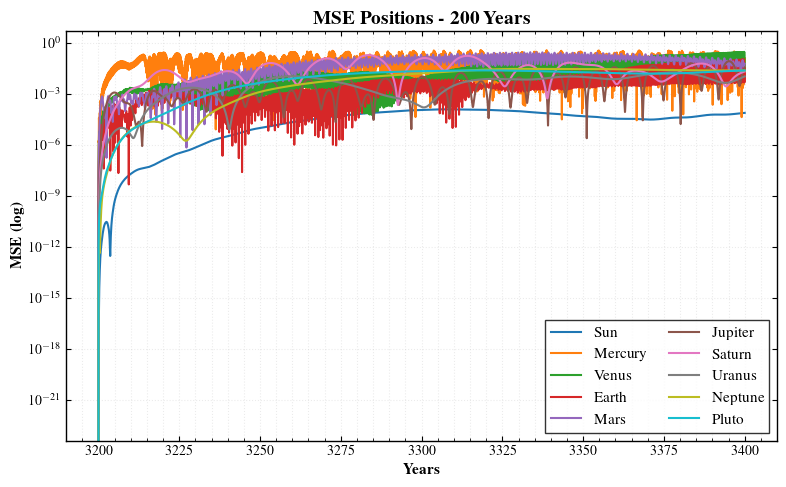

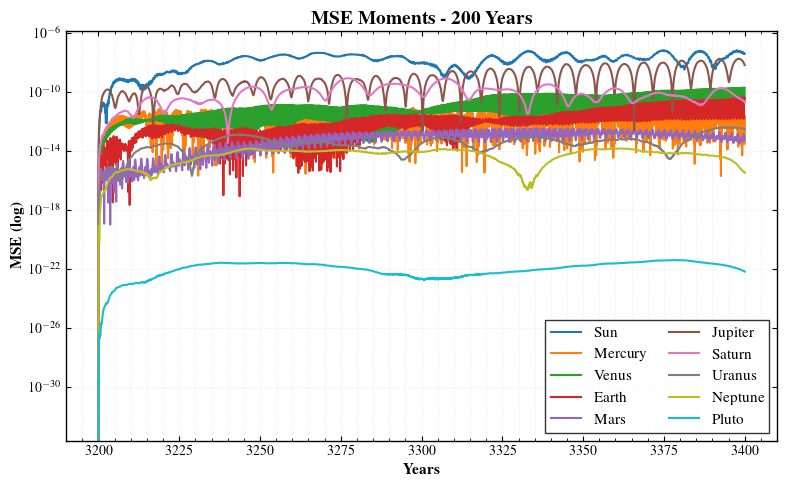

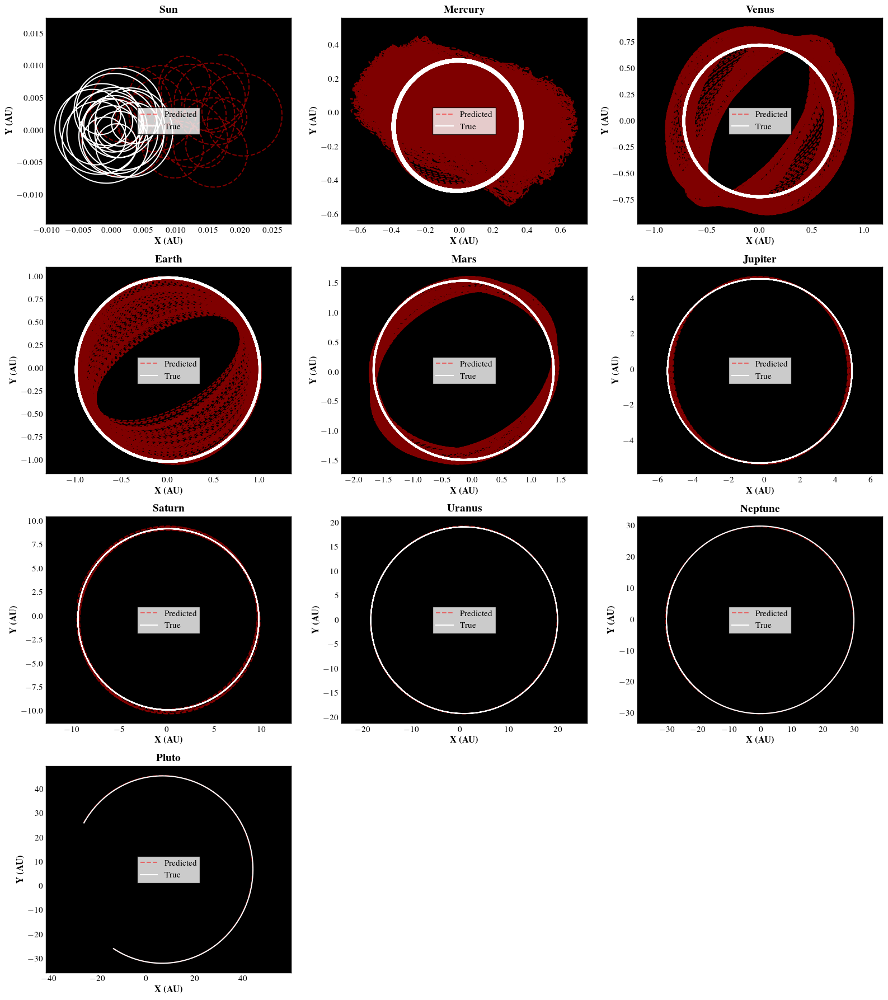

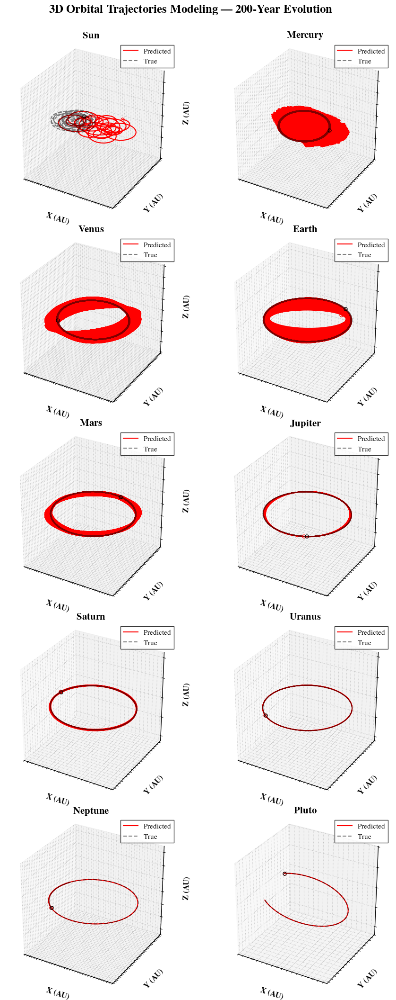

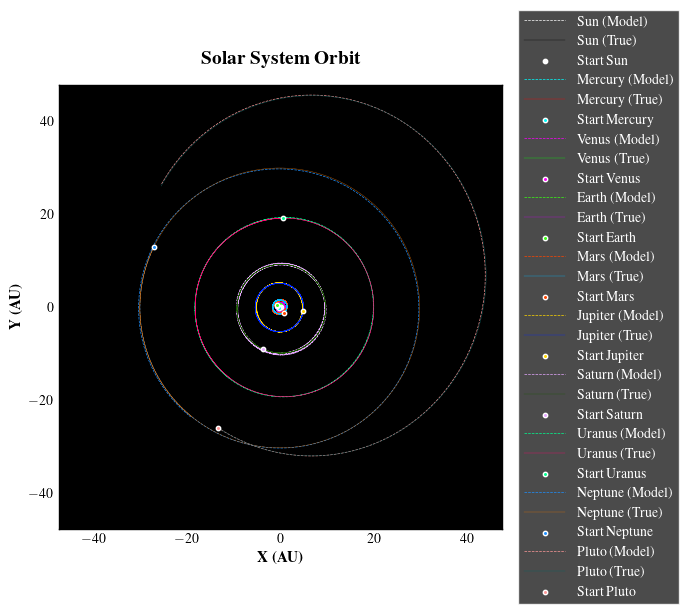

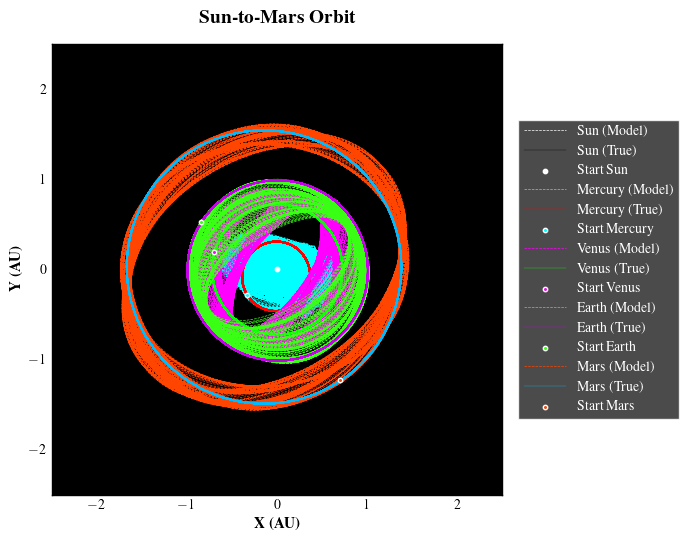

Simulating year 400


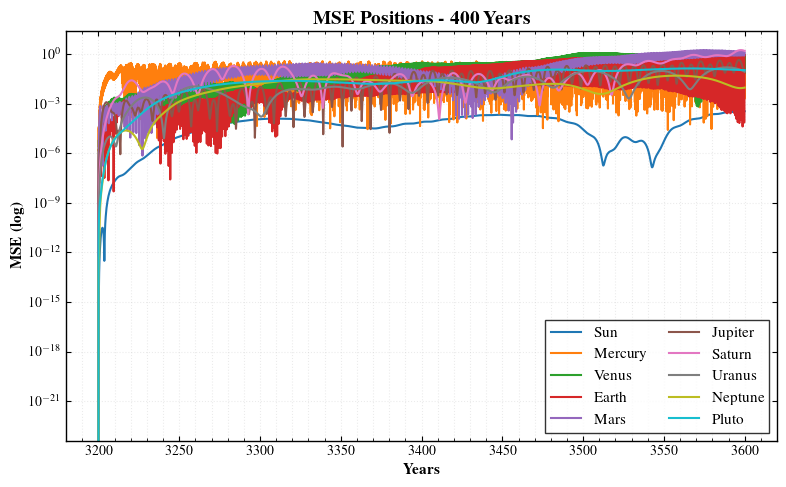

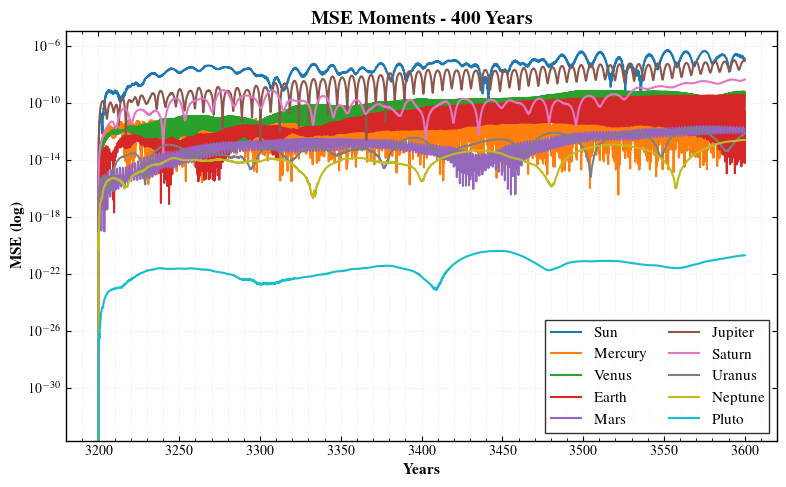

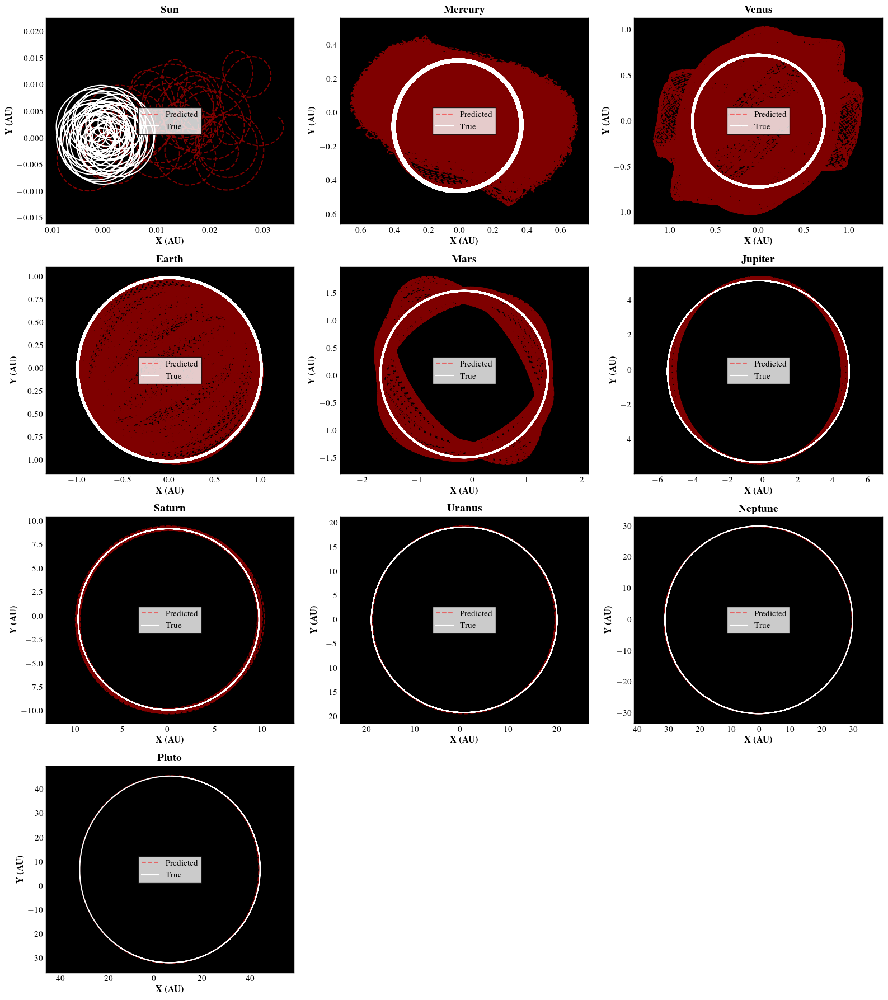

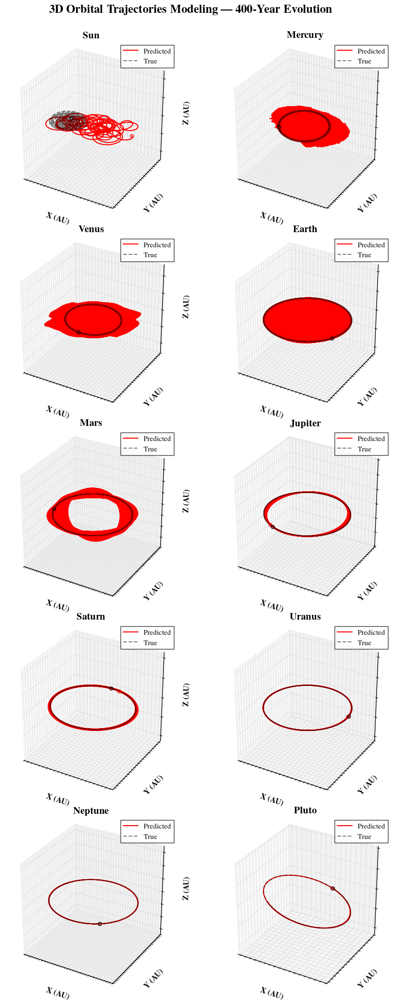

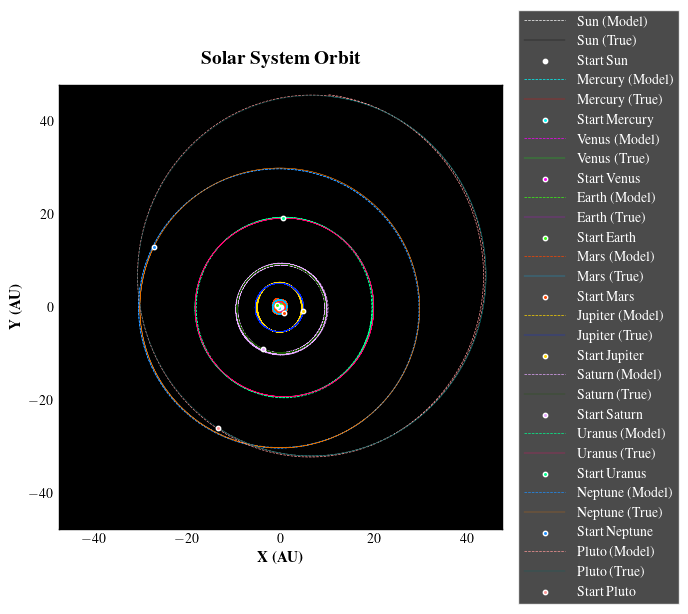

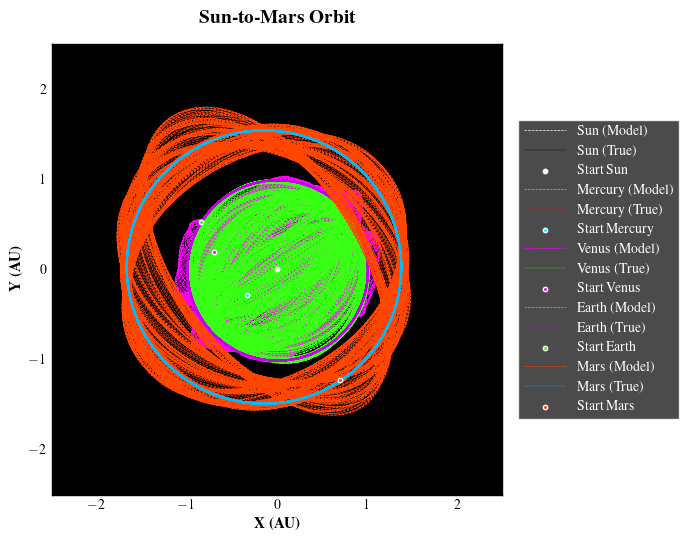

Simulating year 600


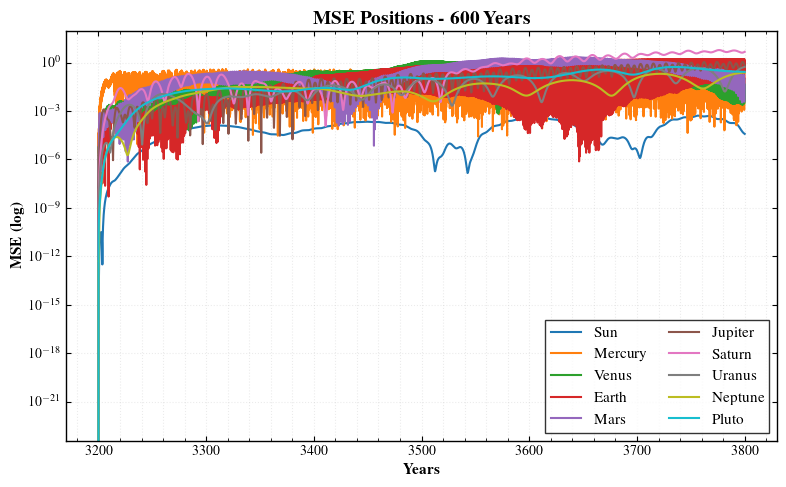

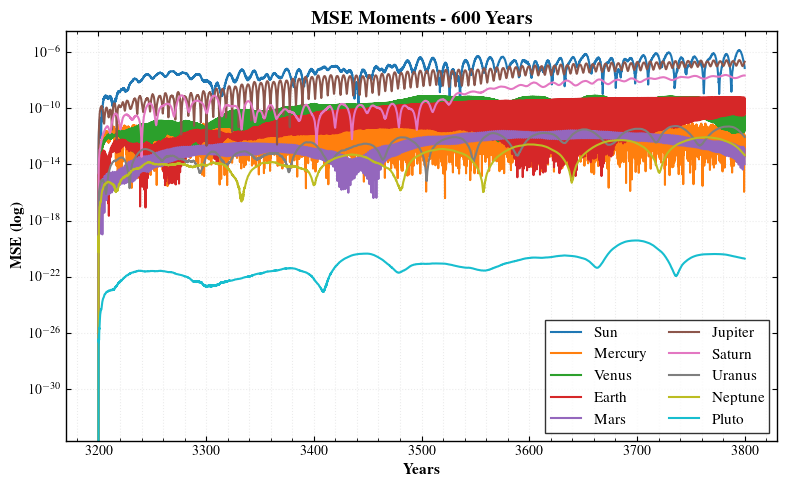

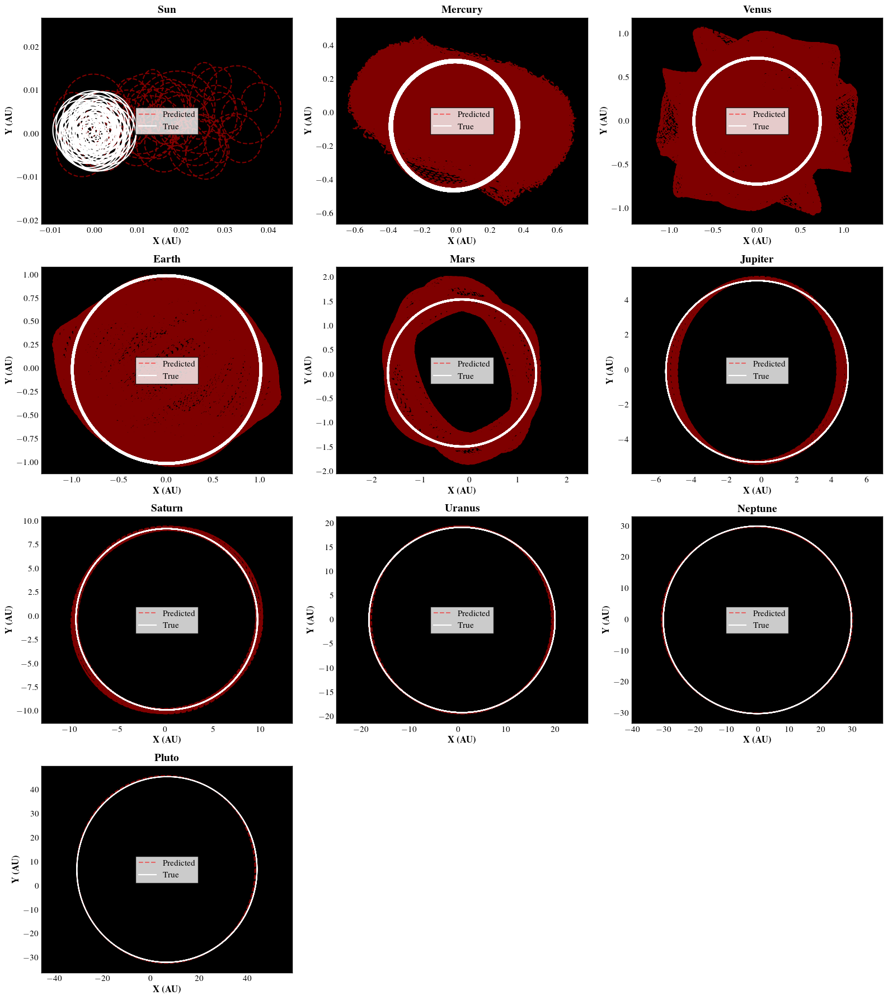

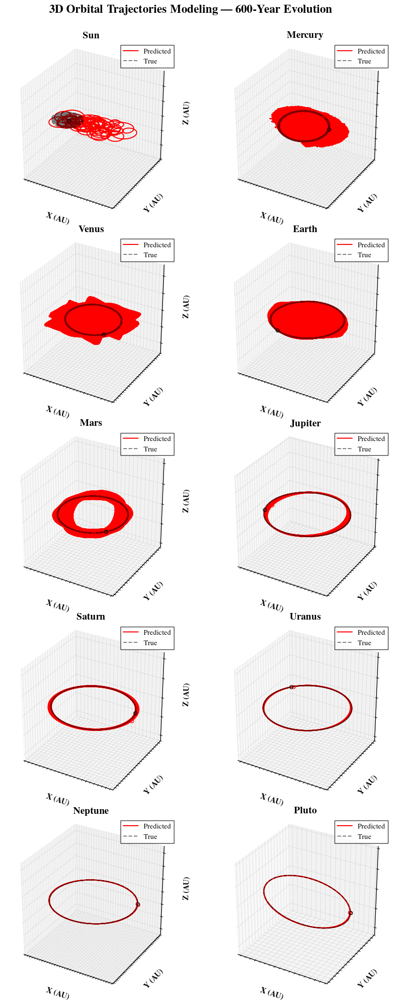

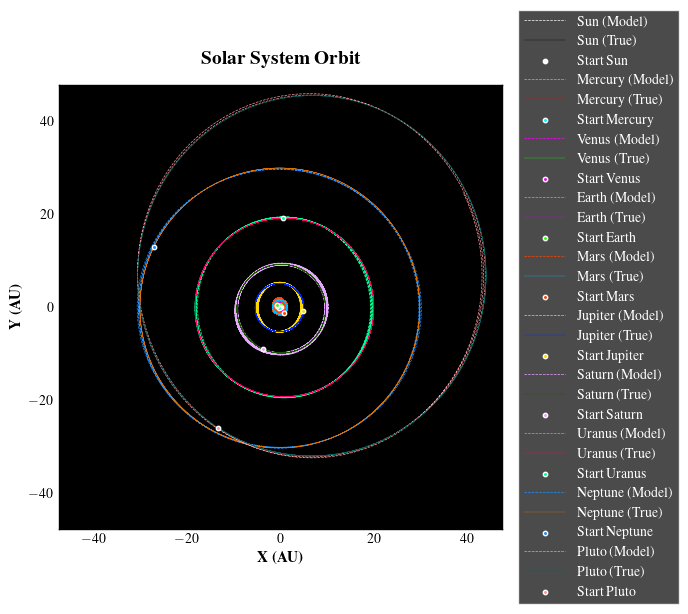

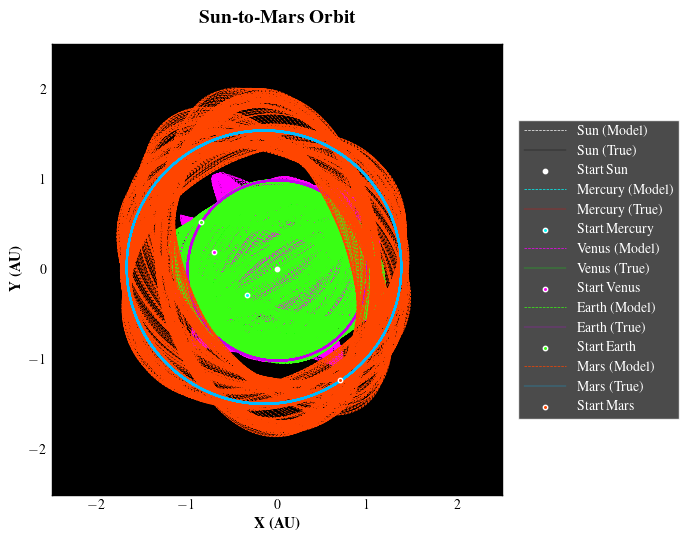

Simulating year 800


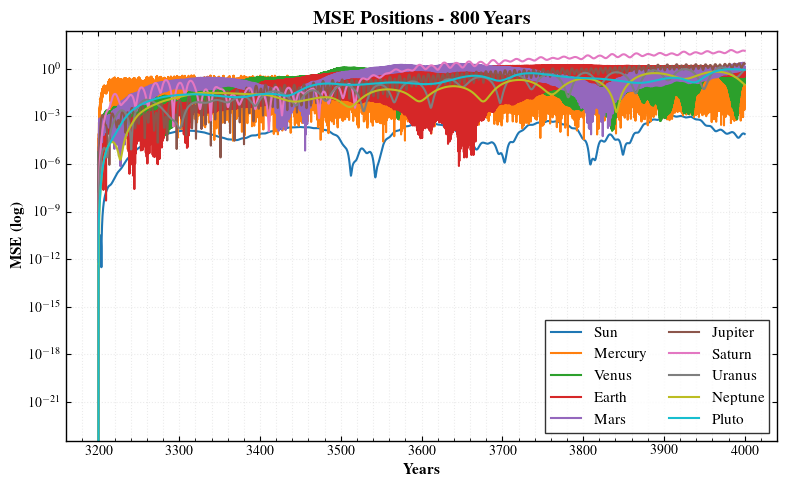

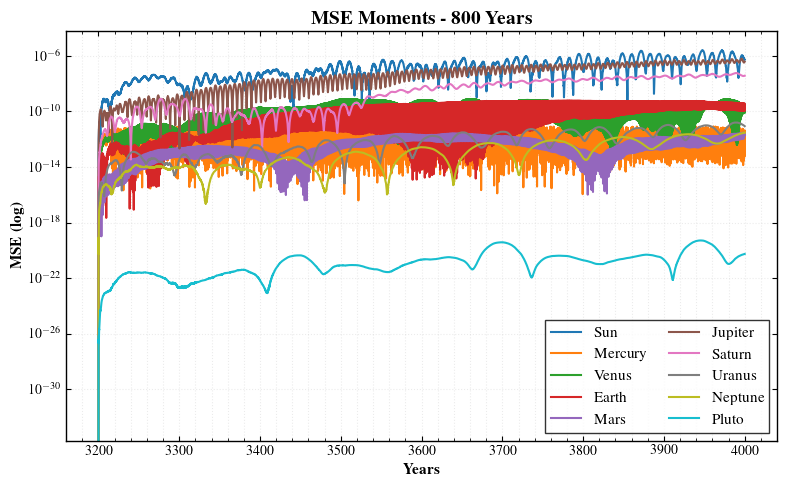

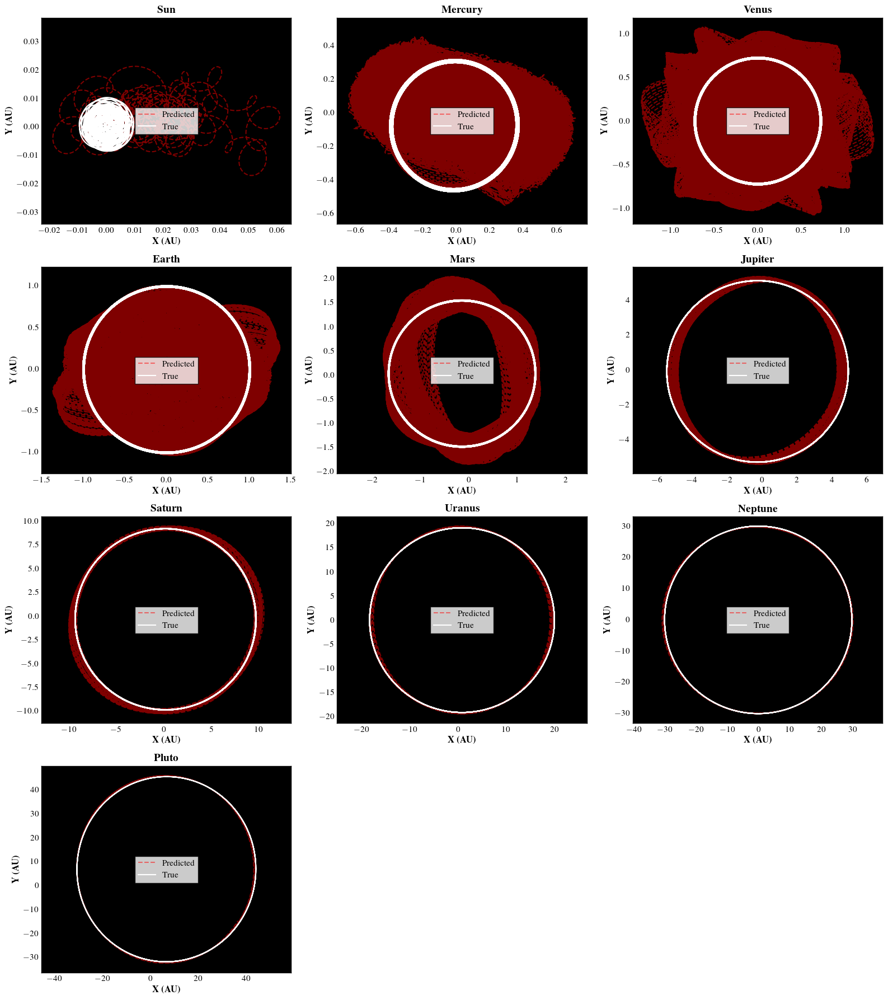

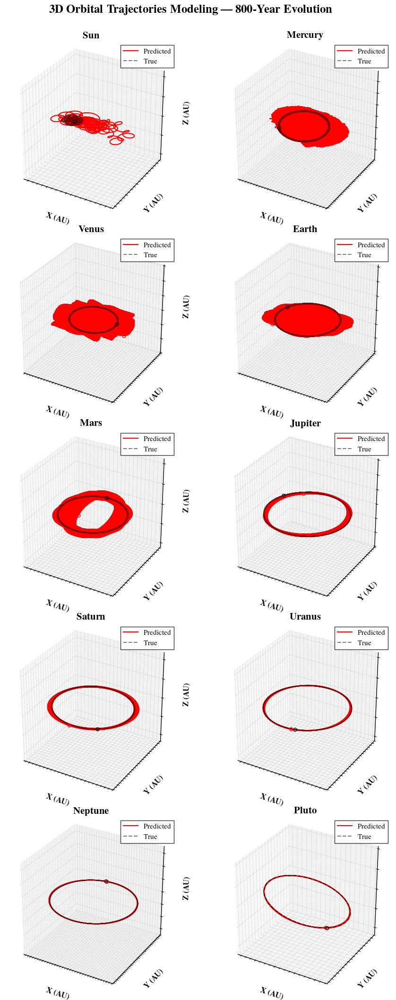

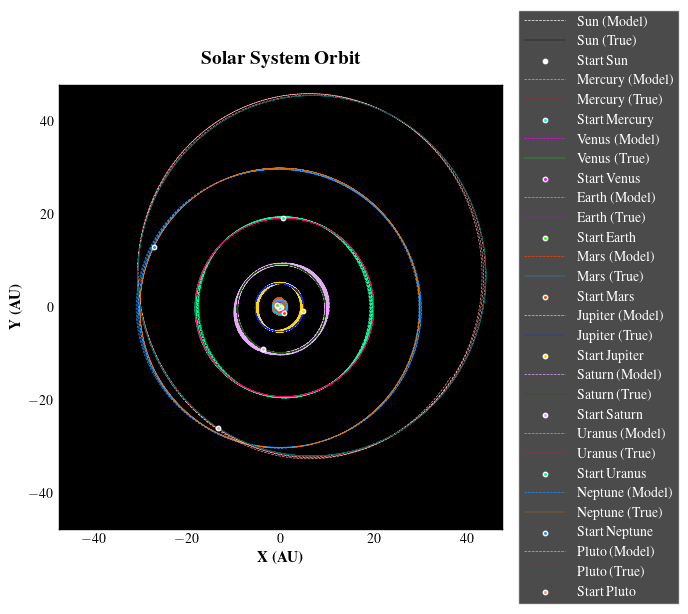

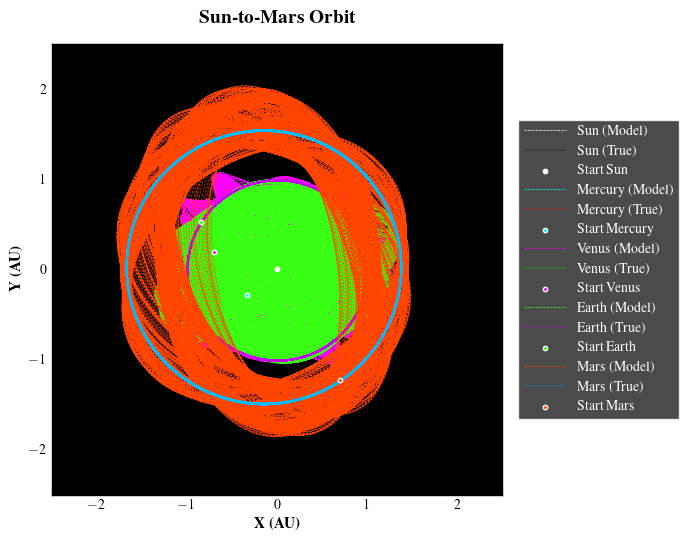

In [11]:
# 2. Slicing and plotting data for each target period
for ppr in years_img:
    fns.plot_simulation_metrics(
        ppr=ppr, 
        dt_cnst=dt_cnst, 
        full_nn_q=full_nn_q, 
        full_nn_p=full_nn_p, 
        Zt=Zt, 
        planets=planets, 
        colors=colors,
        path_save=os.path.join(ubicacion_base, "MSE-Orbits.npz"),
        max_year=max(years_img)
    )